# DIP Project - All Images

<a id="home"></a>


| Section| Topic |
| :- | :- |
| 1 |  [Images Pre-Proccessing](#Pre_Proccessing) | 
| 2 |  [Cell Borders Detection](#Cell_Borders) | 
| 3 |  [Stress Fibers Detection](#Fibers) | 
| 4 |  [Analyze](#Analyze) | 

In [1]:
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2
from skimage.filters import frangi, threshold_otsu
from skimage.exposure import rescale_intensity
from scipy.ndimage import maximum_filter, minimum_filter
import pandas as pd
from typing import Union

In [2]:
def show(*args, titles=None):
    images = len(args)
    rows = int(np.ceil(images / 5.0))   
    cols = min(5, images)              

    fig, ax = plt.subplots(rows, cols, figsize=(8 * cols, 8 * rows))

    for i, img in enumerate(args):
        if rows == 1:  
            if cols == 1: 
                ax.imshow(img, cmap='gray')
            else:  
                ax[i].imshow(img, cmap='gray')
                if titles:
                    ax[i].set_title(titles[i], fontsize=15)
        else: 
            row = i // 5
            col = i % 5
            ax[row, col].imshow(img, cmap='gray')
            if titles:
                ax[row, col].set_title(titles[i], fontsize=25)


    if images < rows * cols:
        for i in range(images, rows * cols):
            fig.delaxes(ax.flatten()[i])
    plt.tight_layout()
    plt.show()

[Go to the beginning of the assignment](#home)
<a id="Pre_Proccessing"></a>
## Images Pre-Proccessing

In [3]:
def read_zstack(image_path: str):
    _, zstack = cv2.imreadmulti(image_path)
    return zstack

def zstack_show(image_path: str):
    zstack = read_zstack(image_path)
    show(*zstack)
    

In [4]:
def normalize_image(image: np.ndarray):
    normalized_image = cv2.normalize(image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    return normalized_image

def enhance_contrast(layer: np.ndarray):
    if layer.dtype != np.uint8:
        layer = normalize_image(layer)
    equalized = cv2.equalizeHist(layer)
    return equalized

def emphasize_boundaries(layer: np.ndarray):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    eroded = cv2.erode(layer, kernel, iterations=1)
    dilated = cv2.dilate(eroded, kernel, iterations=1)
    return dilated

def combine_layers(layers: list):
    combined = np.maximum.reduce(layers)
    combined = normalize_image(combined)
    return combined

def process_image(image_path: str, show_img: bool = False):
    image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
    stacked_layers = cv2.split(image)
    tiff_stack = cv2.imreadmulti(image_path)[1]
    enhanced_layers = []
    for layer in stacked_layers:
        enhanced = enhance_contrast(layer)
        emphasized = emphasize_boundaries(enhanced)
        enhanced_layers.append(emphasized)

    bounded_img = tiff_stack[-1] - tiff_stack[1]
    bounded_img = cv2.GaussianBlur(bounded_img, (35,35), 10)
    bounded_img[bounded_img > 0] = 255

    final_output = combine_layers(enhanced_layers)        
    final_output[bounded_img == 0] = 0
    if show_img: show(final_output, titles=["Processed image"])
    return final_output

In [5]:
def gamma_correction(image: np.ndarray, gamma: float):
    return (np.power(image, gamma-1e-12))*255

In [6]:
def apply_multiple_gamma_correction(image: np.ndarray, gamma_values: list):
        gamma_images = []

        normalized_image = normalize_image(image)

        for j in range(len(gamma_values)):
            gamma = gamma_values[j]
            gamma_correction_image = gamma_correction(normalized_image, gamma)
            gamma_images.append(gamma_correction_image)
            
        return gamma_images

In [7]:
def choose_gamma_correction(image: np.array, gamma_values: list, show_img: bool = False):
    gamma_images_lists = apply_multiple_gamma_correction(image, gamma_values)
    titles = ["Original image"] + [f"Image {i+1}, Gamma: {round(gamma_val,2)}" for i, gamma_val in enumerate(gamma_values)]
    if len(gamma_values) > 1:
        show(image, *gamma_images_lists, titles=titles)
        g_num = input("Enter the image number as written in the plot")
        if g_num.isdigit():
            g_num = int(g_num)
        else:
            raise BaseException(f"Wrong input - {g_num} should be a number")
    else:
        if show_img: show(gamma_images_lists[0])
        g_num = 1
    return normalize_image(gamma_images_lists[g_num - 1 ])        

[Go to the beginning of the assignment](#home)
<a id="Cell_Borders"></a>
## Cell Borders Detection

In [8]:
def connect_cell_regions(thresh: np.ndarray, min_cell_length: int = 50):
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(thresh, connectivity=8)
    cells_mask = np.zeros_like(thresh)

    for i in range(1, num_labels):
        if max(stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT]) > min_cell_length:
            cells_mask[labels == i] = 255

    return cells_mask

In [9]:
# 1
def apply_morpholgical_masks(image: np.ndarray, gaussian_values: tuple = (7,0), threshold_val: int = 60, max_filter_val: int = 60, morphology_sizes: Union[list, tuple]= (5,7), 
                            min_cell_len: int = 50, black_white_enhancment: tuple = (3, 10), show_img: bool = False):
    """
    morphology_sizes: tuple or list of tuples, first value for open action, second for close
    gaussian
    """
    
    current_image = image
    gaus_mask, gaus_sigma = gaussian_values
    blur = cv2.GaussianBlur(current_image, (gaus_mask,)*2, gaus_sigma)
    _, thresh = cv2.threshold(blur, threshold_val, 255, cv2.THRESH_BINARY_INV)
    _, outer_line = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV)
    outer_line = maximum_filter(outer_line, max_filter_val)

    if type(morphology_sizes) == tuple:
        morphology_sizes = [morphology_sizes]
    for open_mask, close_mask in morphology_sizes:
        kernel_open = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (open_mask,)*2)
        thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel_open)
        
        kernel_close = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (close_mask,)*2)
        thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel_close)

    cells_mask = connect_cell_regions(thresh, min_cell_len)

    black_enhancment, white_enhancment = black_white_enhancment

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (black_enhancment,)*2)
    cells_mask = cv2.erode(cells_mask, kernel, iterations=2)

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (white_enhancment,)*2)
    cells_mask1 = cv2.dilate(cells_mask, kernel)

    if show_img: show(current_image, cells_mask1)

    return cells_mask1, outer_line

[Go to the beginning of the assignment](#home)
<a id="Fibers"></a>
## Identify Stress Fibers

In [10]:
def equalize_hist(image: np.ndarray):
    hist, bins = np.histogram(image.flatten(), bins=256, range=[0,255])
    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max() / cdf.max()
    cdf_m = np.ma.masked_equal(cdf, 0)
    cdf_m = (cdf_m - cdf_m.min()) * 255 / (cdf_m.max() - cdf_m.min())
    cdf = np.ma.filled(cdf_m, 0).astype('uint8')
    
    img_out = cdf[image.flatten().astype('uint8')]
    img_out = np.reshape(img_out, image.shape)

    return img_out

In [11]:
def identify_fibers(
    equalized_normalized_image: np.ndarray,
    cells_mask: np.ndarray,
    outer_line: np.ndarray,
    frangi_steps: tuple,
    frangi_beta: float,
    min_filter_val: int,
    white_enhancment: Union[list, tuple],
    black_enhancment: Union[list, tuple],
    show_img: bool = False
):
    """
    white_enhancment: Union[list, tuple] = (10, 5):(dilate, erode)
    black_enhancment: Union[list, tuple] = (5, 5):(erode, dilate)
    """
    start, stop, step = frangi_steps
    
    filtered_frangi = frangi(
        equalized_normalized_image,
        np.arange(start, stop, step),
        beta=frangi_beta,
        black_ridges=False,
    )

    filtered_frangi[cells_mask == 0] = 0
    filtered_frangi = minimum_filter(filtered_frangi, min_filter_val)
    filtered_frangi[outer_line > 0] = 0

    for d1, e1 in white_enhancment:
        ed_frangi = cv2.dilate(filtered_frangi, (d1,) * 2)
        ed_frangi = cv2.erode(ed_frangi, (e1,) * 2)

    for e1, d1 in black_enhancment:
        ed_frangi = cv2.erode(ed_frangi, (e1,) * 2)
        ed_frangi = cv2.dilate(ed_frangi, (d1,) * 2)

    normalized_image = normalize_image(ed_frangi)
    eq_image = equalize_hist(normalized_image)
    if show_img: show(equalized_normalized_image, eq_image)

    return eq_image

In [12]:
def convert_gray_to_rgb(image: np.ndarray):
    image_rgb = np.stack((image,)*3, axis=-1)
    return image_rgb

In [13]:
def highligh_fibers(mask: np.ndarray, equalized_normalized_image: np.ndarray):
    image_color = convert_gray_to_rgb(equalized_normalized_image)
    color_mask = np.zeros_like(image_color)
    color_mask[mask > mask.mean()] = [0, 0, 255]
    highlighted_image = cv2.addWeighted(image_color, 1.0, color_mask, 0.5, 0)
    show(highlighted_image)

[Go to the beginning of the assignment](#home)
<a id="Analyze"></a>
## Analyze

In [15]:
def analyze_and_plot_contours(eq_image: np.ndarray):
    contours, _ = cv2.findContours(eq_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

    drawn_image = cv2.cvtColor(eq_image.copy(), cv2.COLOR_GRAY2BGR)
    contour_image = np.zeros_like(eq_image) 

    data = []
    indexed_contours = []  

    for contour in contours:
        length = cv2.arcLength(contour, True)
        area = cv2.contourArea(contour)
        _, _, w, h = cv2.boundingRect(contour)
        thickness = min(w, h)

        if area > 50 and length > 50:        
            indexed_contours.append(contour)
            data.append((len(indexed_contours)-1, length, thickness, area))  
            cv2.drawContours(drawn_image, [contour], 0, (0, 0, 255), 2)  
            cv2.drawContours(contour_image, [contour], 0, (255), 2)  

    df = pd.DataFrame(data, columns=['ContourIndex', 'Length', 'Thickness', 'Area'])

    fig, ax = plt.subplots(1, 3, figsize=(24, 6))

    ax[0].hist(df['Length'], bins=20, color='blue', edgecolor='black')
    ax[0].set_title('Distribution of Fiber Lengths')
    ax[0].set_xlabel('Length')
    ax[0].set_ylabel('Frequency')

    ax[1].hist(df['Thickness'], bins=20, color='green', edgecolor='black')
    ax[1].set_title('Distribution of Fiber Thicknesses')
    ax[1].set_xlabel('Thickness')
    ax[1].set_ylabel('Frequency')

    ax[2].hist(df['Area'], bins=20, color='purple', edgecolor='black')
    ax[2].set_title('Distribution of Fiber Areas')
    ax[2].set_xlabel('Area')
    ax[2].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show() 
    
    show(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB), contour_image)

    return df, indexed_contours, contour_image

In [16]:
def analyze_and_plot_contours(eq_image: np.ndarray):
    contours, _ = cv2.findContours(eq_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

    drawn_image = cv2.cvtColor(eq_image.copy(), cv2.COLOR_GRAY2BGR)
    contour_image = np.zeros_like(eq_image) 

    data = []
    indexed_contours = []  

    total_contours = len(contours)

    for contour in contours:
        length = cv2.arcLength(contour, True)
        area = cv2.contourArea(contour)
        _, _, w, h = cv2.boundingRect(contour)
        thickness = min(w, h)

        if area > 50 and length > 50:        
            indexed_contours.append(contour)
            data.append((len(indexed_contours)-1, length, thickness, area))  
            cv2.drawContours(drawn_image, [contour], 0, (0, 0, 255), 2)  
            cv2.drawContours(contour_image, [contour], 0, (255), 2)  

    filtered_contours = len(indexed_contours)

    df = pd.DataFrame(data, columns=['ContourIndex', 'Length', 'Thickness', 'Area'])

    fig, ax = plt.subplots(1, 4, figsize=(32, 6))

    ax[0].hist(df['Length'], bins=20, color='blue', edgecolor='black')
    ax[0].set_title('Distribution of Fiber Lengths')
    ax[0].set_xlabel('Length')
    ax[0].set_ylabel('Frequency')

    ax[1].hist(df['Thickness'], bins=20, color='green', edgecolor='black')
    ax[1].set_title('Distribution of Fiber Thicknesses')
    ax[1].set_xlabel('Thickness')
    ax[1].set_ylabel('Frequency')

    ax[2].hist(df['Area'], bins=20, color='purple', edgecolor='black')
    ax[2].set_title('Distribution of Fiber Areas')
    ax[2].set_xlabel('Area')
    ax[2].set_ylabel('Frequency')

    ax[3].bar(['Total', 'Filtered'], [total_contours, filtered_contours], color=['red', 'blue'])
    ax[3].set_title('Number of Fibers Before and After Filtering')
    ax[3].set_ylabel('Number of Fibers')

    plt.tight_layout()
    plt.show() 

    show(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB), contour_image)
    print(type(indexed_contours))
    return df, indexed_contours, contour_image


In [17]:
def highlight_and_report_fibers(df: pd.DataFrame, indexed_contours: list, eq_image: np.ndarray):
    
    image = cv2.cvtColor(eq_image.copy(), cv2.COLOR_GRAY2BGR)

    longest_fiber_index = df.loc[df['Length'].idxmax(), 'ContourIndex']
    longest_fiber = df['Length'].max()
    cv2.drawContours(image, [indexed_contours[int(longest_fiber_index)]], -1, (0, 0, 255), 2)

    thickest_fiber_index = df.loc[df['Thickness'].idxmax(), 'ContourIndex']
    thickest_fiber = df['Thickness'].max()
    cv2.drawContours(image, [indexed_contours[int(thickest_fiber_index)]], -1, (0, 255, 0), 2)

    show(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    print(f"Longest Fiber Length (red): {longest_fiber}")
    print(f"Thickest Fiber (green): {thickest_fiber}")

    avg_length = df['Length'].mean()
    avg_thickness = df['Thickness'].mean()

    print(f"Average Length of Fibers: {avg_length}")
    print(f"Average Thickness of Fibers: {avg_thickness}")

In [18]:
def run(image_path: str, gaussian_vals: tuple, thresh_val: int, max_val: int, morph_sizes: list, min_cell_len: int,
                            bw_morph_enhance: tuple, frangi_steps: tuple = (0.5,3, 1.5), frangi_beta: float = 0.3, frangi_min_filter: int = 2,
                            w_frangi_enhance: Union[list, tuple] = [(10, 5), (9, 3)], b_frangi_enhance: Union[list, tuple] = [(5, 5), (15, 5)], show_processed: bool = False ,show_gamma: bool = False,
                            show_morph: bool= False, show_fibers:bool = False, paint_fibers: bool = True, analyze_data: bool = True):
    processed_image = process_image(image_path, show_processed)
    # image = choose_gamma_correction(processed_image, gamma_values)
    gamma_image = choose_gamma_correction(processed_image, [3], show_gamma)
    morph_image, outer_line = apply_morpholgical_masks(gamma_image, gaussian_vals, thresh_val, max_val, morph_sizes, min_cell_len,
                            bw_morph_enhance, show_morph)
    eq_image = equalize_hist(gamma_image)
    fibers_image = identify_fibers(eq_image, morph_image, outer_line, frangi_steps, frangi_beta, frangi_min_filter, w_frangi_enhance, b_frangi_enhance, show_fibers)
    if paint_fibers: highligh_fibers(fibers_image, eq_image)
    if analyze_data:
        df, indexed_contours, fibers = analyze_and_plot_contours(fibers_image)
        print(df)
        highlight_and_report_fibers(df, indexed_contours, fibers)

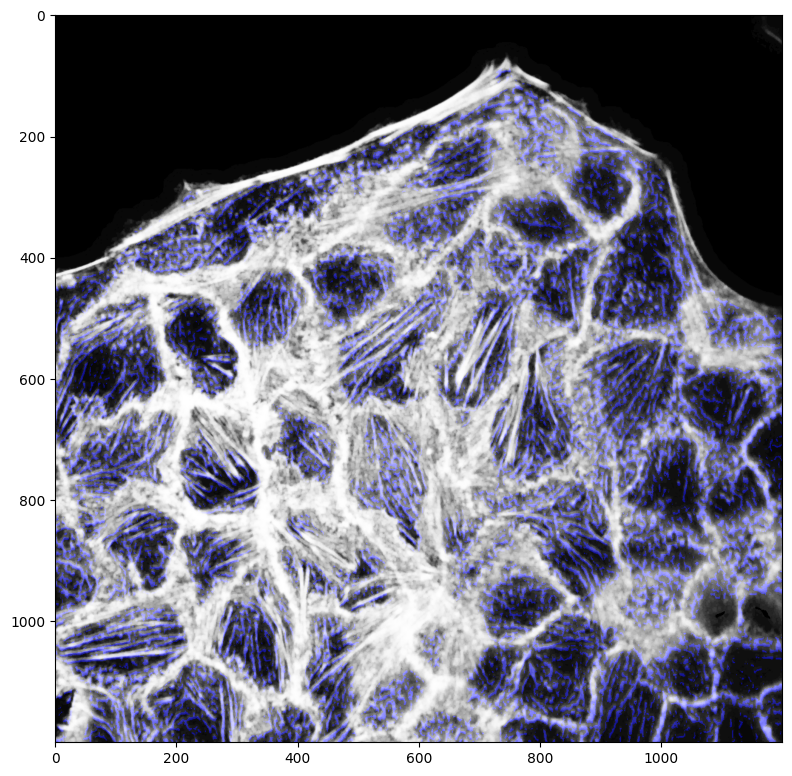

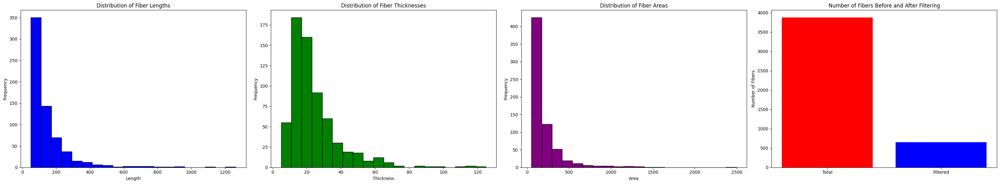

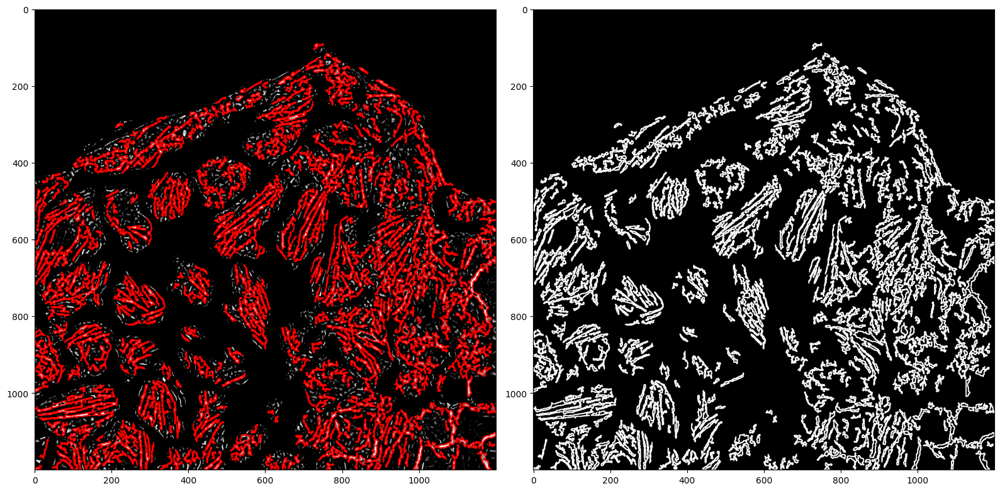

<class 'list'>
     ContourIndex      Length  Thickness   Area
0               0   61.213203         12   62.5
1               1   81.698484         19  116.5
2               2  133.639609         20  112.5
3               3   58.041630         11   53.5
4               4   83.112698         21   71.0
..            ...         ...        ...    ...
649           649  107.597979         16  193.0
650           650  238.793937         33  303.0
651           651   69.698484         15  103.5
652           652   66.284271         17   87.0
653           653   87.012193         18  103.5

[654 rows x 4 columns]


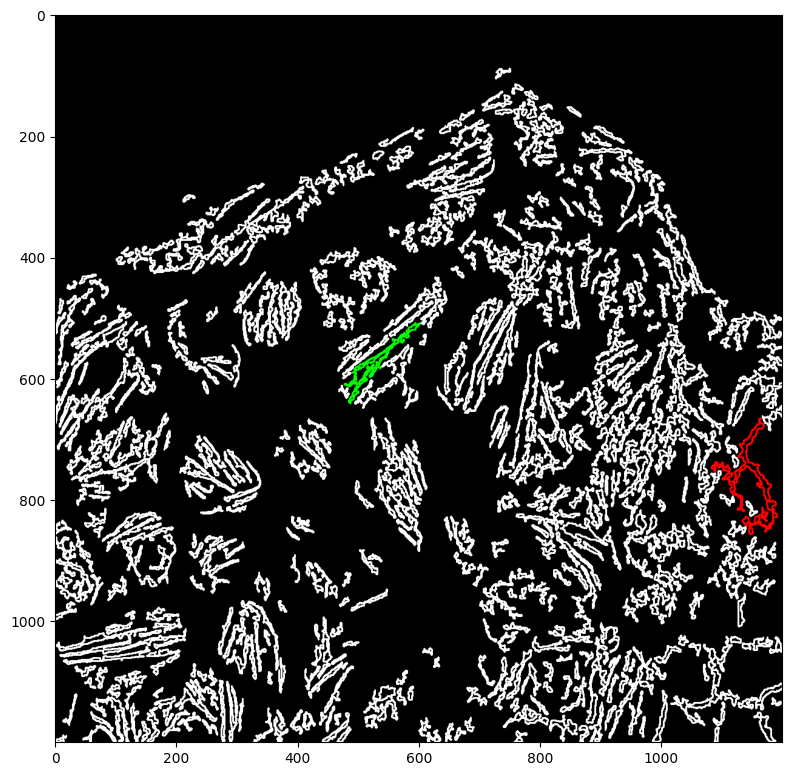

Longest Fiber Length (red): 1263.0996288061142
Thickest Fiber (green): 125
Average Length of Fibers: 147.93448666093548
Average Thickness of Fibers: 23.8914373088685


In [19]:
gamma_values = [0.5, 1.5, 2, 3]
gaussian_vals = (7, 0)
thresh_val = 80
max_val = 60
min_cell_len = 50
morph_sizes = [(5, 7), (5, 9)]
bw_morph_enhance = (3, 10)
run("pic1.TIF", gaussian_vals, thresh_val, max_val, morph_sizes, min_cell_len,
                            bw_morph_enhance)

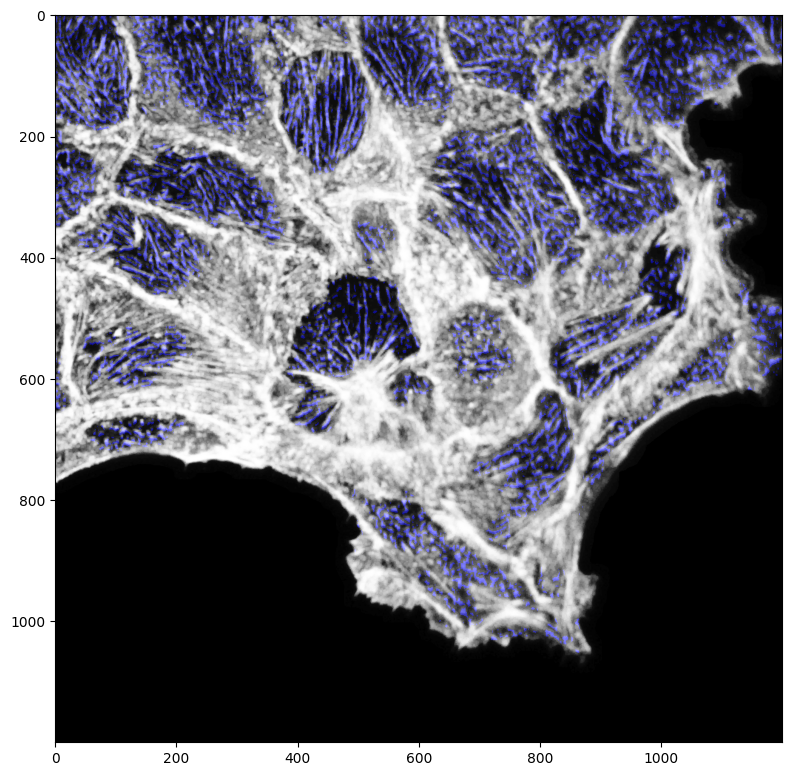

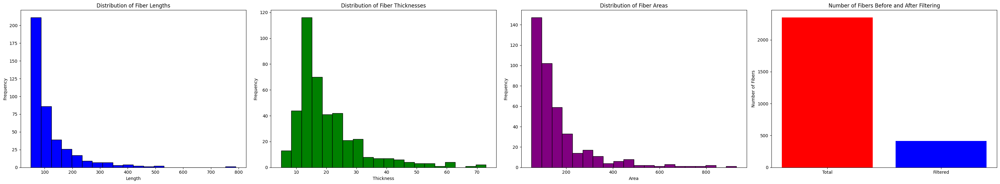

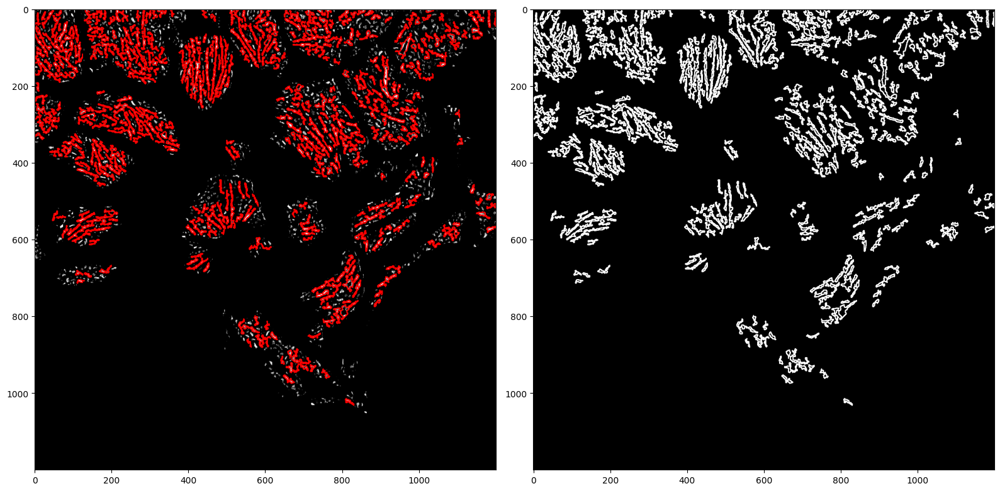

<class 'list'>
     ContourIndex      Length  Thickness   Area
0               0   79.112698         19  106.0
1               1   97.497474         23  168.5
2               2   91.355338         22  130.5
3               3   64.284271         15  103.0
4               4  168.225396         27  214.0
..            ...         ...        ...    ...
410           410   69.798990          8   84.0
411           411   98.284271         16  102.0
412           412  157.154328         19  220.5
413           413   59.213203         14   76.5
414           414   77.112698         18  124.0

[415 rows x 4 columns]


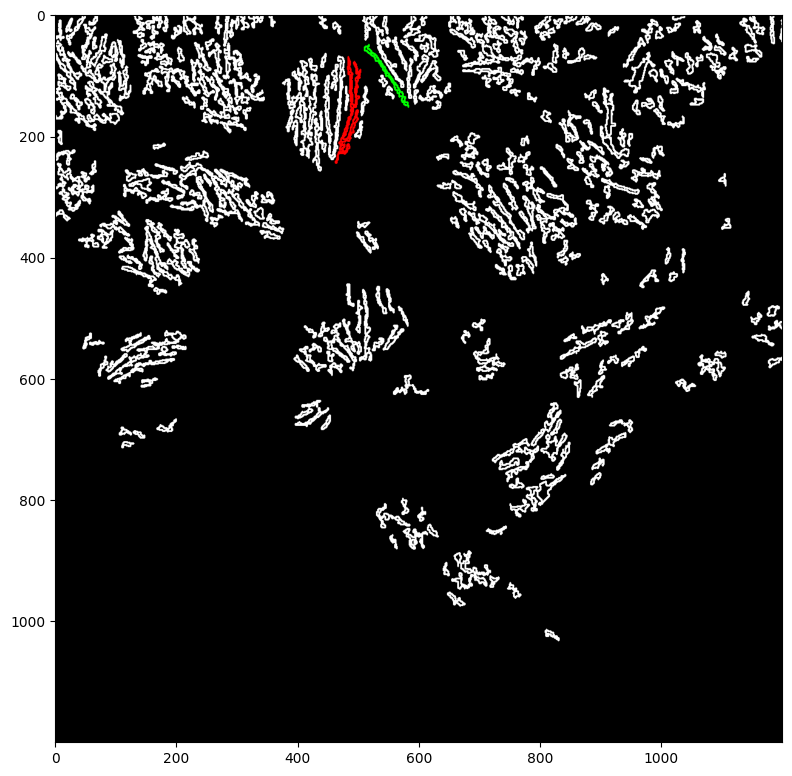

Longest Fiber Length (red): 789.9137753248215
Thickest Fiber (green): 73
Average Length of Fibers: 117.77125260312873
Average Thickness of Fibers: 20.38313253012048


In [23]:
# 2
gaussian_vals = (13, 0)
thresh_val = 60
max_val = 60
min_cell_len = 50
morph_sizes = (5, 10)
bw_morph_enhance = (4, 11)
run("pic2.TIF", gaussian_vals, thresh_val, max_val, morph_sizes, min_cell_len,
                            bw_morph_enhance)

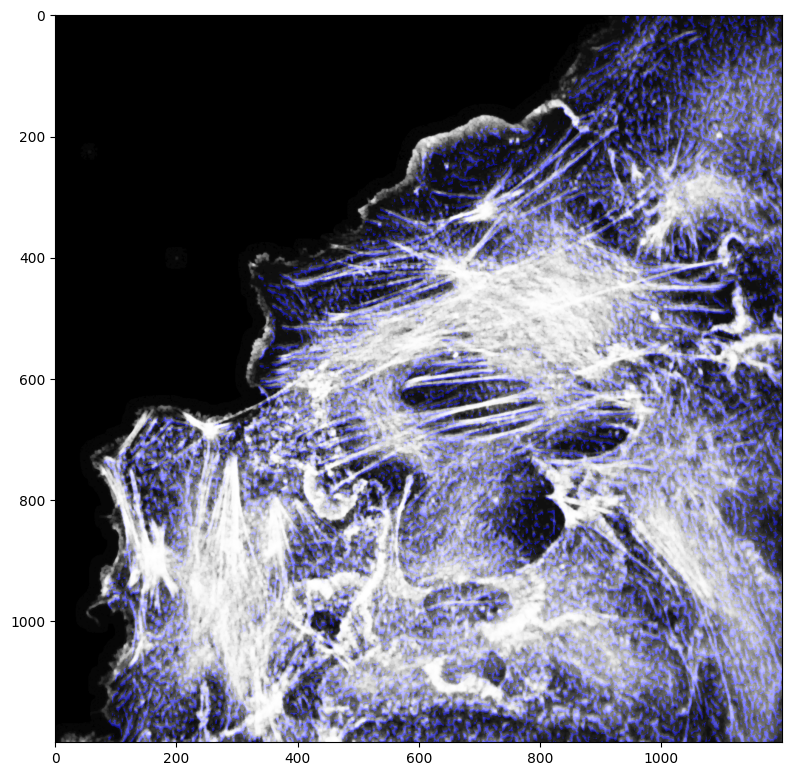

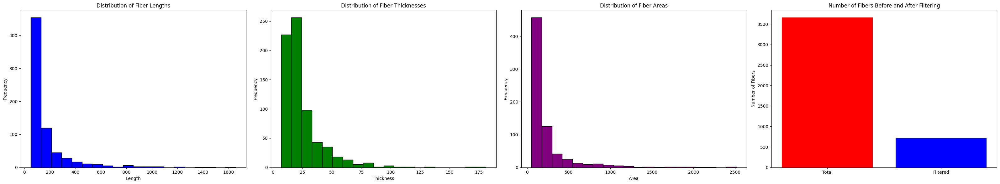

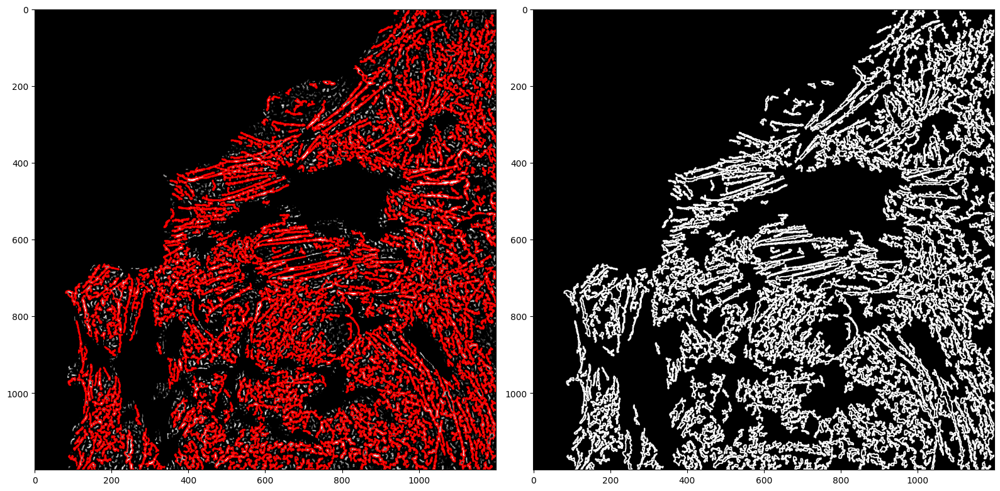

<class 'list'>
     ContourIndex      Length  Thickness   Area
0               0   52.384776         13   73.5
1               1   60.041630         18   72.5
2               2   56.627417          9   51.0
3               3  106.568542         19  145.0
4               4   57.798990         11   83.0
..            ...         ...        ...    ...
707           707   66.627417         13   69.0
708           708   76.526911         15   83.5
709           709   90.769552         18   88.0
710           710  109.840620         21  139.5
711           711   52.384776         12   54.5

[712 rows x 4 columns]


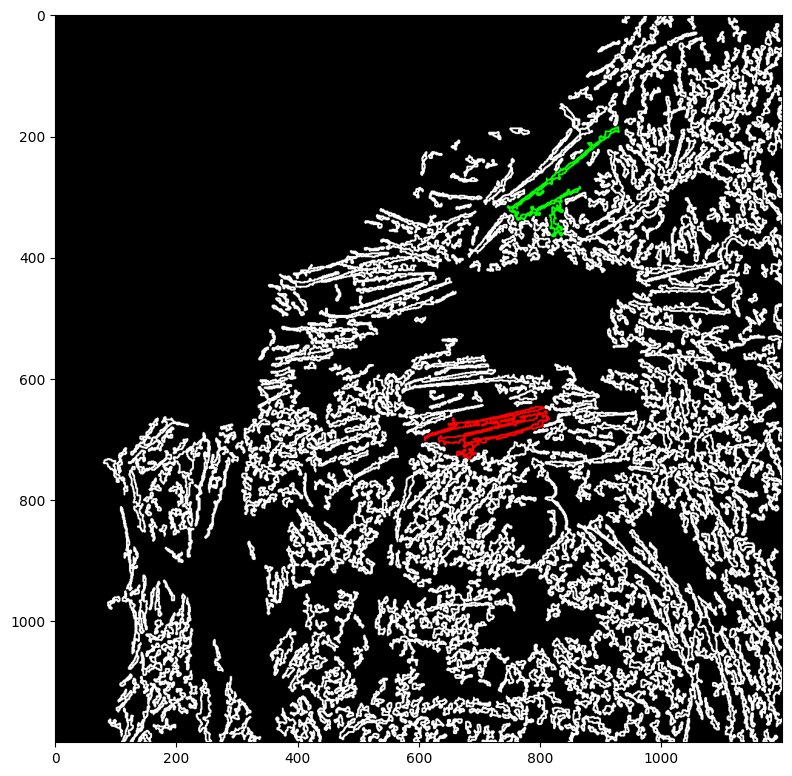

Longest Fiber Length (red): 1657.1412589550018
Thickest Fiber (green): 181
Average Length of Fibers: 168.7078720831804
Average Thickness of Fibers: 24.71769662921348


In [25]:
# 3
gaussian_vals = (7, 0)
thresh_val = 150
max_val = 60
min_cell_len = 80
morph_sizes = (3, 7)
bw_morph_enhance = (4, 11)
run("pic3.TIF", gaussian_vals, thresh_val, max_val, morph_sizes, min_cell_len,
                            bw_morph_enhance)

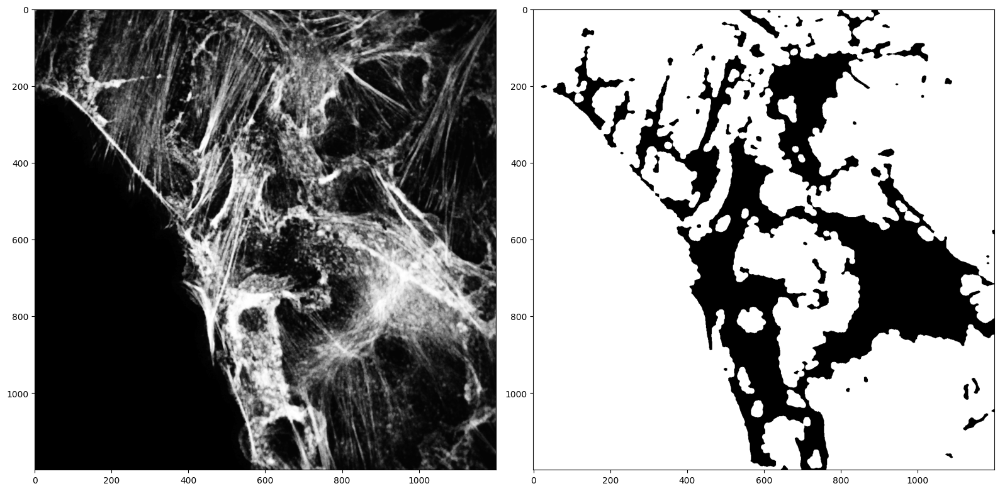

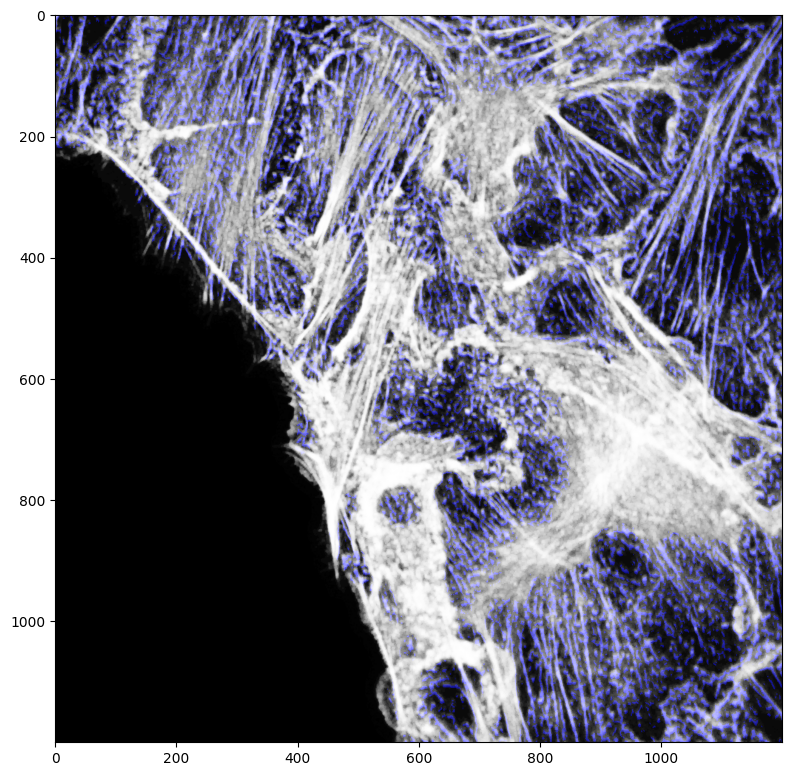

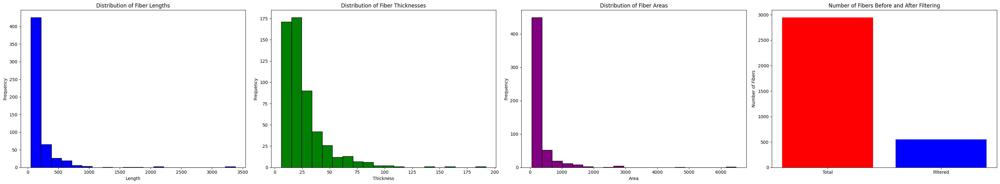

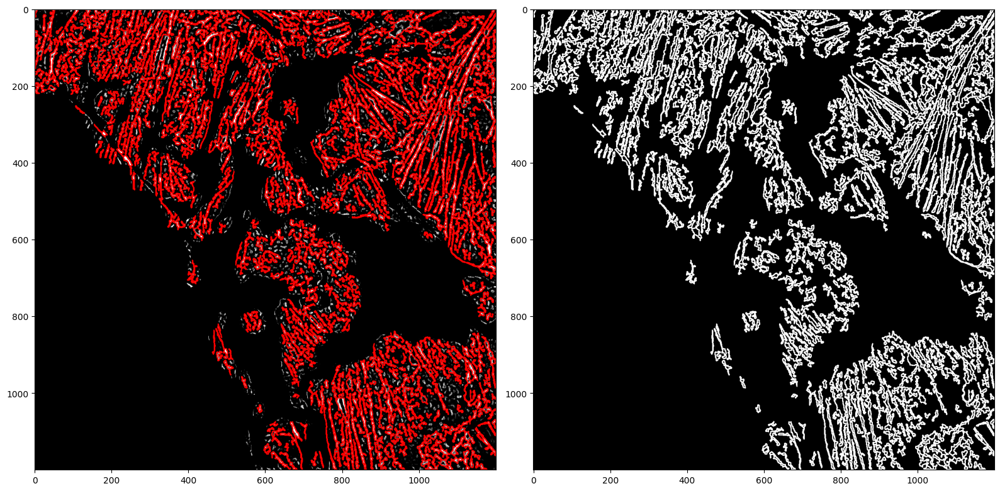

<class 'list'>
     ContourIndex      Length  Thickness    Area
0               0  109.254833         21   183.0
1               1   50.384776         13    70.5
2               2   74.284271         10   121.0
3               3  165.639609         46   225.5
4               4   53.213203         10    65.5
..            ...         ...        ...     ...
546           546  127.597979         29   224.0
547           547  266.651802         29   444.0
548           548  195.338094         36   308.0
549           549  669.144223         53  1181.5
550           550   54.727922          7    61.5

[551 rows x 4 columns]


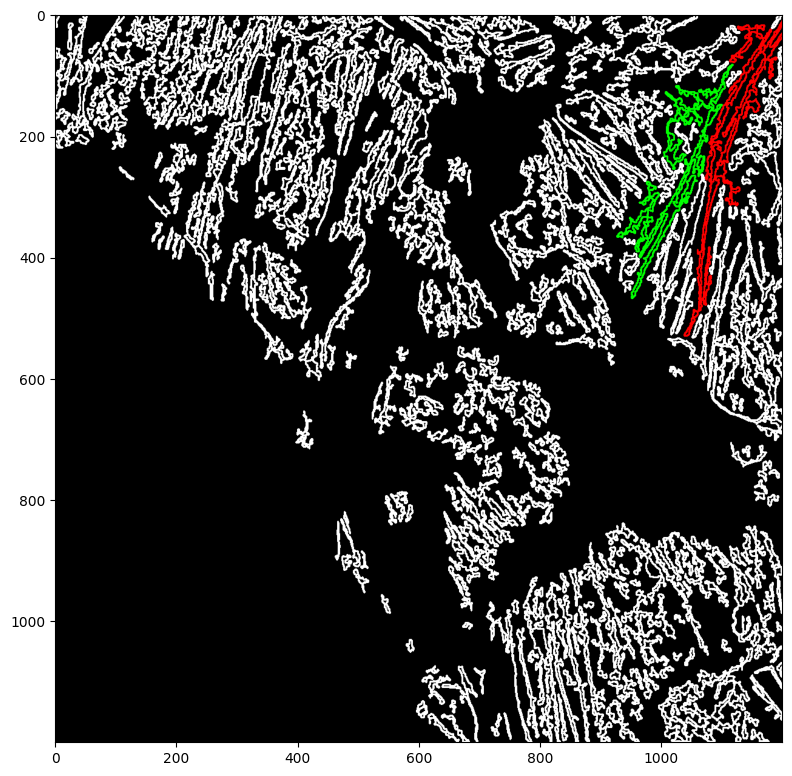

Longest Fiber Length (red): 3380.171908020973
Thickest Fiber (green): 192
Average Length of Fibers: 198.86025740468568
Average Thickness of Fibers: 26.353901996370237


In [26]:
# 4
gaussian_vals = (7, 0)
thresh_val = 80
max_val = 60
min_cell_len = 30
morph_sizes = (5, 13)
bw_morph_enhance = (5, 15)
run("pic4.TIF", gaussian_vals, thresh_val, max_val, morph_sizes, min_cell_len,
                            bw_morph_enhance, show_morph=True)